<a href="https://colab.research.google.com/github/ayeshabaig575/FYP/blob/main/Segmentation_Model_Unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip /content/drive/MyDrive/Dataset_BUSI_with_GT.zip -d /content/

Archive:  /content/drive/MyDrive/Dataset_BUSI_with_GT.zip
   creating: /content/Dataset_BUSI_with_GT/
  inflating: /content/__MACOSX/._Dataset_BUSI_with_GT  
   creating: /content/Dataset_BUSI_with_GT/malignant/
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/._malignant  
   creating: /content/Dataset_BUSI_with_GT/benign/
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/._benign  
   creating: /content/Dataset_BUSI_with_GT/normal/
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/._normal  
  inflating: /content/Dataset_BUSI_with_GT/malignant/malignant (185)_mask.png  
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/malignant/._malignant (185)_mask.png  
  inflating: /content/Dataset_BUSI_with_GT/malignant/malignant (5)_mask.png  
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/malignant/._malignant (5)_mask.png  
  inflating: /content/Dataset_BUSI_with_GT/malignant/malignant (206).png  
  inflating: /content/__MACOSX/Dataset_BUSI_with_GT/malignant/._malignant (206).p

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import random
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torch
import torch.optim as optim
from torch.utils.data import Dataset
from PIL import Image
import torch.nn as nn
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset
from torchvision import transforms

In [ ]:
masks = []
for root, dirs, files in os.walk("/content/Dataset_BUSI_with_GT"):
    for file in files:
        if file.endswith("_mask.png"):
            masks.append(os.path.join(root, file))

In [ ]:
images = [mask_images.replace("_mask", "") for mask_images in masks]

In [ ]:
series = list(zip(images, masks))

In [ ]:
def display_images_with_masks(image_and_mask):
    img = cv2.imread(image_and_mask[0])
    mask_img = cv2.imread(image_and_mask[1])
    fig, axes = plt.subplots(1, 3, figsize=(6, 6))

    axes[0].imshow(np.squeeze(img), cmap='gray', origin='lower')
    axes[0].set_title('Original CT', fontsize=14)
    axes[0].set_xticks([])
    axes[0].set_yticks([])

    axes[1].imshow(np.squeeze(mask_img), cmap='jet', origin='lower')
    axes[1].set_title('Segmentation Mask', fontsize=14)
    axes[1].axis('off')

    axes[2].imshow(np.squeeze(img), cmap='gray', origin='lower')
    axes[2].imshow(np.squeeze(mask_img), cmap='jet', alpha=0.5, origin='lower')
    axes[2].set_title('Combined View', fontsize=14)
    axes[2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()

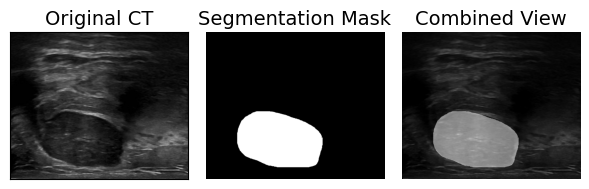

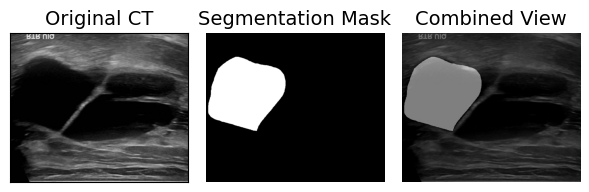

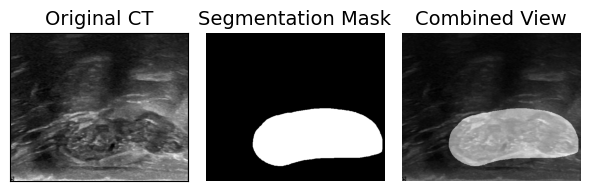

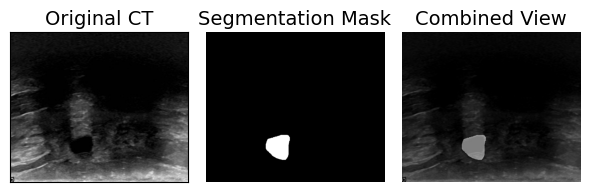

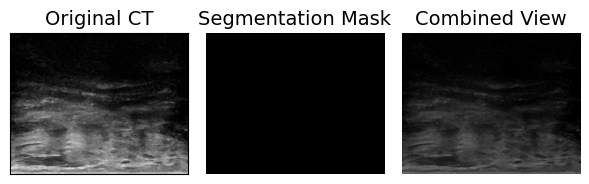

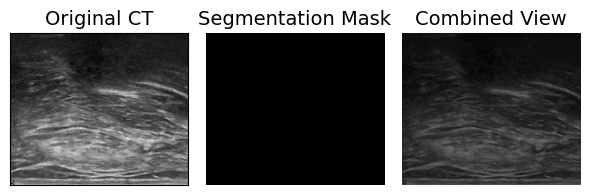

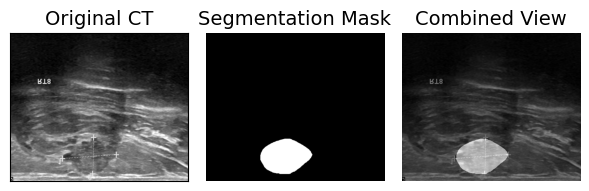

In [ ]:
sample_indices = random.sample(range(750), 7)
for idx in sample_indices:
    display_images_with_masks(series[idx])

In [ ]:
dataset = pd.DataFrame(series, columns=['image_path', 'mask_path'])

In [ ]:
train, test= train_test_split(dataset, test_size=0.25,train_size=0.75)

In [ ]:
class CustomImageMaskDataset(Dataset):
    np.random.seed(42)
    torch.manual_seed(42)
    def __init__(self, dataframe, image_transform=None):
        self.data = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = self.data.iloc[idx]['image_path']
        mask_path = self.data.iloc[idx]['mask_path']

        image = Image.open(image_path).convert('L')
        mask = Image.open(mask_path).convert('L')

        if self.image_transform:
            image = self.image_transform(image)
            mask = self.image_transform(mask)

        return image, mask

image_size = 128

train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])


train_dataset = CustomImageMaskDataset(train, train_transforms)
test_dataset = CustomImageMaskDataset(test, val_transforms)
batch_size = 16
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, input_channel, out_channel, dropout):
        super(ConvBlock, self).__init__()
        self.conv2d_1 = nn.Conv2d(input_channel, out_channel, kernel_size=3, padding=1)
        self.batchnorm_1 = nn.BatchNorm2d(out_channel)
        self.relu_1 = nn.ReLU()

        self.dropout = nn.Dropout(dropout)

        self.conv2d_2 = nn.Conv2d(out_channel, out_channel, kernel_size=3, padding=1)
        self.batchnorm_2 = nn.BatchNorm2d(out_channel)
        self.relu_2 = nn.ReLU()

    def forward(self, x):
        x = self.conv2d_1(x)
        x = self.batchnorm_1(x)
        x = self.relu_1(x)

        x = self.dropout(x)

        x = self.conv2d_2(x)
        x = self.batchnorm_2(x)
        x = self.relu_2(x)

        return x

class Encoder(nn.Module):
    def __init__(self, input_channel, out_channel, dropout):
        super(Encoder, self).__init__()
        self.conv2d_1 = ConvBlock(input_channel, out_channel, dropout)
        self.maxpool = nn.MaxPool2d((2,2))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = self.conv2d_1(x)
        p = self.maxpool(x)
        p = self.dropout(p)

        return x, p

class Decoder(nn.Module):
    def __init__(self, input_channel, output_channel, dropout):
        super(Decoder, self).__init__()
        self.conv_t = nn.ConvTranspose2d(input_channel, output_channel, stride=2, kernel_size=2)
        self.conv2d_1 = ConvBlock(output_channel*2, output_channel, dropout)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, skip):
        x = self.conv_t(x)
        x = torch.cat([x, skip], dim=1)
        x = self.dropout(x)
        x = self.conv2d_1(x)

        return x

In [ ]:
class Unet(nn.Module):

    def __init__(self, input_channel=1):
        super().__init__()
        self.encoder_1 = Encoder(input_channel, 64, 0.07)
        self.encoder_2 = Encoder(64, 128, 0.08)
        self.encoder_3 = Encoder(128, 256, 0.09)
        self.encoder_4 = Encoder(256, 512, 0.1)

        self.conv_block = ConvBlock(512, 1024, 0.11)

        self.decoder_1 = Decoder(1024, 512, 0.1)
        self.decoder_2 = Decoder(512, 256, 0.09)
        self.decoder_3 = Decoder(256, 128, 0.08)
        self.decoder_4 = Decoder(128, 64, 0.07)

        self.cls = nn.Conv2d(64, 1, kernel_size=1, padding=0)
        self.relu = nn.Sigmoid()

    def forward(self, x):

        # Encoder
        x1, p1 = self.encoder_1(x)
        x2, p2 = self.encoder_2(p1)
        x3, p3 = self.encoder_3(p2)
        x4, p4 = self.encoder_4(p3)

        # BottleNeck
        x5 = self.conv_block(p4)

        # Decoder
        x6 = self.decoder_1(x5, x4)
        x7 = self.decoder_2(x6, x3)
        x8 = self.decoder_3(x7, x2)
        x9 = self.decoder_4(x8, x1)

        # Final Layer
        x_final = self.cls(x9)
        x_final = self.relu(x_final)

        return x_final


In [ ]:
class Trainer:
    def __init__(self, model, num_epochs, optimizer, criterion, device):
        self.num_epochs = num_epochs
        self.optimizer = optimizer
        self.criterion = criterion
        self.model = model
        self.device = device
        self.log_interval = 15

        # Lists to store training and validation metrics
        self.train_losses = []
        self.val_losses = []
        self.train_dices = []
        self.val_dices = []

        self.best_model = None
        self.best_dice = 0.0
        self.best_epoch = 0

    def dice_coeff(self, predicted, target, smooth=1e-6):
        intersection = torch.sum(predicted * target)
        union = torch.sum(predicted) + torch.sum(target)
        dice = (2. * intersection + smooth) / (union + smooth)
        return dice

    def iou(self, pred_mask, true_mask):
        intersection = torch.logical_and(pred_mask, true_mask).sum().item()
        union = torch.logical_or(pred_mask, true_mask).sum().item()
        iou_score = intersection / union if union != 0 else 0.0
        return iou_score

    def save_best_model(self, epoch, dice):
        if dice > self.best_dice:
            self.best_dice = dice
            self.best_epoch = epoch
            self.best_model = self.model.state_dict()

            filename = f'best_model_epoch{epoch}_dice{dice:.4f}.pth'
            torch.save(self.best_model, filename)

    def train(self, train_loader, val_loader):
        for epoch in range(self.num_epochs):
            train_loss = 0.0
            val_loss = 0.0
            train_dice = 0.0
            val_dice = 0.0

            # Training loop
            for i, (images, masks) in enumerate(train_loader):
                images, masks = images.to(self.device), masks.to(self.device)

                self.model.train()
                self.optimizer.zero_grad()

                outputs = self.model(images)
                loss = self.criterion(outputs, masks)
                dice = self.dice_coeff(outputs, masks)

                loss.backward()
                self.optimizer.step()

                train_loss += loss.item()
                train_dice += dice

                if (i + 1) % self.log_interval == 0:
                    print(f'Epoch [{epoch + 1}/{self.num_epochs}], Step [{i + 1}/{len(train_loader)}], Loss: {loss.item():.4f}, Dice Coef: {dice:.4f}')

            # Validation loop
            self.model.eval()
            with torch.no_grad():
                for images, masks in val_loader:
                    images, masks = images.to(self.device), masks.to(self.device)
                    outputs = self.model(images)
                    val_loss += self.criterion(outputs, masks).item()
                    val_dice += self.dice_coeff(outputs, masks)

            avg_train_loss = train_loss / len(train_loader)
            avg_val_loss = val_loss / len(val_loader)
            avg_train_dice = train_dice / len(train_loader)
            avg_val_dice = val_dice / len(val_loader)

            print(f'Epoch [{epoch + 1}/{self.num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}')
            print(f'Epoch [{epoch + 1}/{self.num_epochs}], Train Dice: {avg_train_dice:.4f}, Val Dice: {avg_val_dice:.4f}')

            self.train_losses.append(avg_train_loss)
            self.val_losses.append(avg_val_loss)
            self.train_dices.append(avg_train_dice)
            self.val_dices.append(avg_val_dice)
            self.save_best_model(epoch + 1, avg_val_dice)

    def get_metrics(self):
        return {
            'train_losses': self.train_losses,
            'val_losses': self.val_losses,
            'train_dices': self.train_dices,
            'val_dices': self.val_dices,
            'best_model': self.best_model,
            'best_dice': self.best_dice,
            'best_epoch': self.best_epoch
        }

In [ ]:
def dice_coef_loss(inputs, target):
    smooth = 1e-6
    intersection = 2.0 * (target*inputs).sum() + smooth
    union = target.sum() + inputs.sum() + smooth
    return 1 - (intersection/union)

def bce_dice_loss(inputs, target):
    dice_score = dice_coef_loss(inputs, target)
    bce_loss = nn.BCELoss()
    bce_score = bce_loss(inputs, target)

    return bce_score + dice_score


In [ ]:
unet = Unet(1).to(device)

In [ ]:
learning_rate = 0.0001
weight_decay = 1e-6

optimizer = optim.Adam(unet.parameters(), lr=learning_rate, weight_decay=weight_decay)

trainer = Trainer(model=unet, num_epochs=100, optimizer=optimizer, criterion=bce_dice_loss, device=device)

In [ ]:
trainer.train(train_dataloader, test_dataloader)
metrics = trainer.get_metrics()

Epoch [1/100], Step [15/37], Loss: 1.4046, Dice Coef: 0.2477
Epoch [1/100], Step [30/37], Loss: 1.2011, Dice Coef: 0.2684
Epoch [1/100], Train Loss: 1.4383, Val Loss: 1.2667
Epoch [1/100], Train Dice: 0.1870, Val Dice: 0.1871
Epoch [2/100], Step [15/37], Loss: 1.2881, Dice Coef: 0.2099
Epoch [2/100], Step [30/37], Loss: 1.2328, Dice Coef: 0.2501
Epoch [2/100], Train Loss: 1.2102, Val Loss: 1.1529
Epoch [2/100], Train Dice: 0.2360, Val Dice: 0.2478
Epoch [3/100], Step [15/37], Loss: 1.1418, Dice Coef: 0.2544
Epoch [3/100], Step [30/37], Loss: 1.0612, Dice Coef: 0.2931
Epoch [3/100], Train Loss: 1.1315, Val Loss: 1.1356
Epoch [3/100], Train Dice: 0.2653, Val Dice: 0.2424
Epoch [4/100], Step [15/37], Loss: 1.0642, Dice Coef: 0.2900
Epoch [4/100], Step [30/37], Loss: 0.9667, Dice Coef: 0.3810
Epoch [4/100], Train Loss: 1.0833, Val Loss: 1.0868
Epoch [4/100], Train Dice: 0.2820, Val Dice: 0.2621
Epoch [5/100], Step [15/37], Loss: 1.0631, Dice Coef: 0.2890
Epoch [5/100], Step [30/37], Loss: 

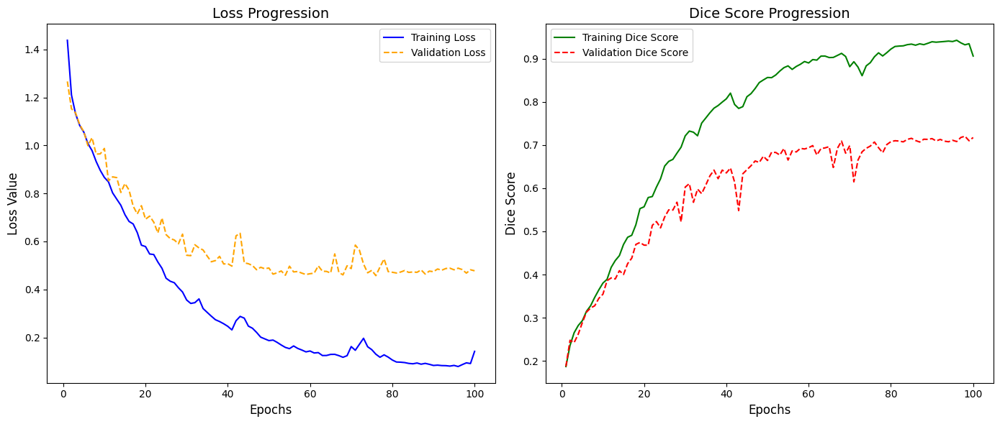

Best Validation Dice Score: 0.7203 at Epoch 98
Training Losses: 0.14199298841727748
Validation Losses: 0.47774248169018674
Training Dice Scores: 0.9059398770332336
Validation Dice Scores: 0.717242419719696


In [ ]:
def tensor_to_numpy(tensor):
    """
    Converts a PyTorch tensor to a NumPy array after detaching and moving it to CPU.
    """
    return tensor.cpu().detach().numpy().item()

def visualize_training_metrics(metrics):
    total_epochs = len(metrics['train_losses'])
    epoch_indices = np.arange(1, total_epochs + 1)

    train_losses = metrics['train_losses']
    val_losses = metrics['val_losses']
    train_dice_scores = [tensor_to_numpy(dice) for dice in metrics['train_dices']]
    val_dice_scores = [tensor_to_numpy(dice) for dice in metrics['val_dices']]

    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epoch_indices, train_losses, label='Training Loss', color='blue', linestyle='-')
    plt.plot(epoch_indices, val_losses, label='Validation Loss', color='orange', linestyle='--')
    plt.title('Loss Progression', fontsize=14)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss Value', fontsize=12)
    plt.legend(fontsize=10)

    plt.subplot(1, 2, 2)
    plt.plot(epoch_indices, train_dice_scores, label='Training Dice Score', color='green', linestyle='-')
    plt.plot(epoch_indices, val_dice_scores, label='Validation Dice Score', color='red', linestyle='--')
    plt.title('Dice Score Progression', fontsize=14)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Dice Score', fontsize=12)
    plt.legend(fontsize=10)

    plt.tight_layout()
    plt.show()

    print(f"Best Validation Dice Score: {metrics['best_dice']:.4f} at Epoch {metrics['best_epoch']}")
    print(f"Training Losses: {train_losses[-1]}")
    print(f"Validation Losses: {val_losses[-1]}")
    print(f"Training Dice Scores: {train_dice_scores[-1]}")
    print(f"Validation Dice Scores: {val_dice_scores[-1]}")

visualize_training_metrics(metrics)

In [ ]:
def to_numpy(tensor):
    return tensor.cpu().detach().numpy()

def threshold_prediction(predicted, threshold=0.5):
    predicted = predicted.copy()
    predicted[predicted < threshold] = 0
    predicted[predicted >= threshold] = 1
    return predicted

def smooth_mask(prediction, kernel_size=(5, 5), sigma=0):
    pred_np = prediction.cpu().detach().numpy()
    pred_np = (pred_np * 255).astype(np.uint8)
    smoothed = cv2.GaussianBlur(pred_np, kernel_size, sigma)
    smoothed = smoothed.astype(np.float32) / 255.0
    return smoothed

def plot_subplots(image, mask, predicted, threshold=0.5):
    image_np, mask_np, predicted_np = map(to_numpy, (image, mask, predicted))
    predicted_np_thresholded = threshold_prediction(predicted_np, threshold)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    titles = ['Image', 'Original Mask (Ground Truth)', 'Predicted Mask']
    for ax, data, title in zip(axes, [image_np, mask_np, predicted_np_thresholded], titles):
        ax.imshow(data.squeeze(), cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.show()

In [ ]:
from sklearn.metrics import jaccard_score
from sklearn.metrics import accuracy_score, f1_score

def calculate_metrics(gt_mask, pred_mask):
    """Calculate evaluation metrics."""
    # Flatten the arrays
    gt_flat = gt_mask.flatten()
    pred_flat = pred_mask.flatten()

    gt_flat = (gt_flat > 0.5).astype(np.uint8)
    pred_flat = (pred_flat > 0.5).astype(np.uint8)

    pixel_accuracy = accuracy_score(gt_flat, pred_flat)
    iou = jaccard_score(gt_flat, pred_flat, average='binary')
    dice_coefficient = f1_score(gt_flat, pred_flat, average='binary')

    return pixel_accuracy, iou, dice_coefficient

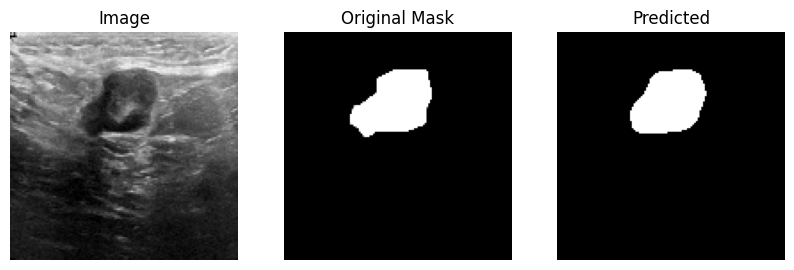

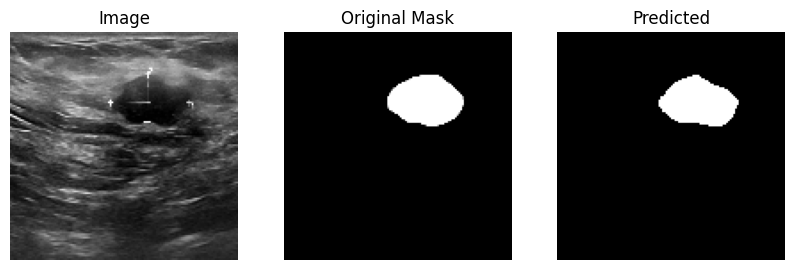

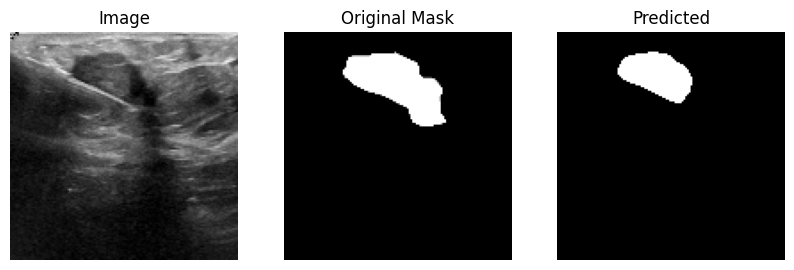

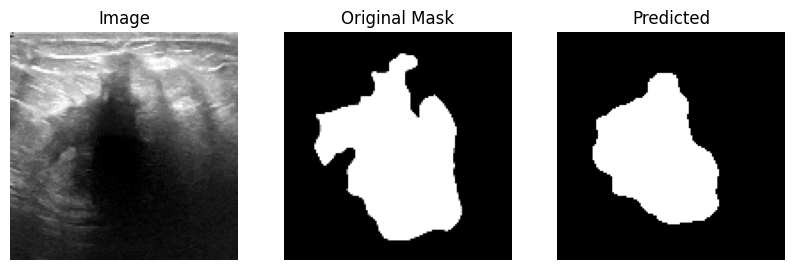

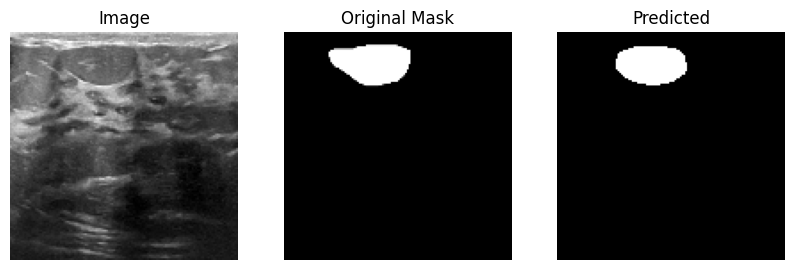

...

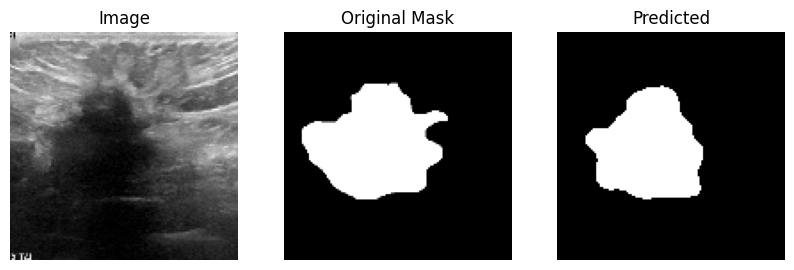

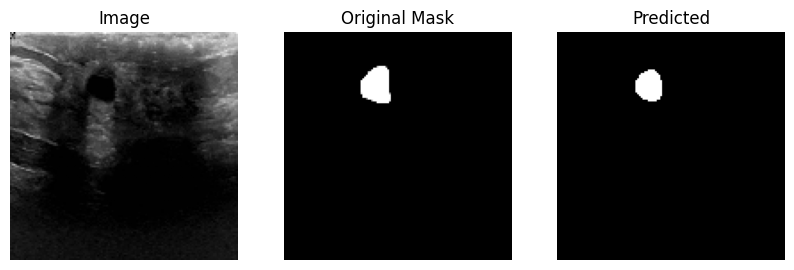

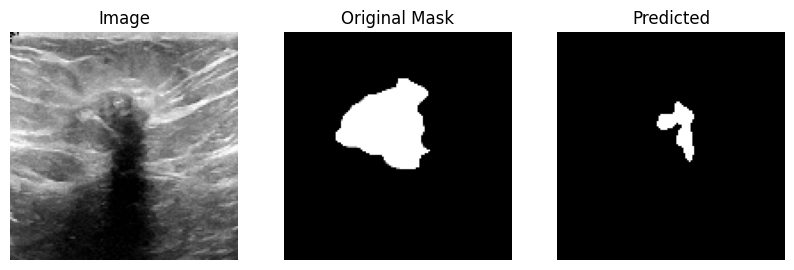

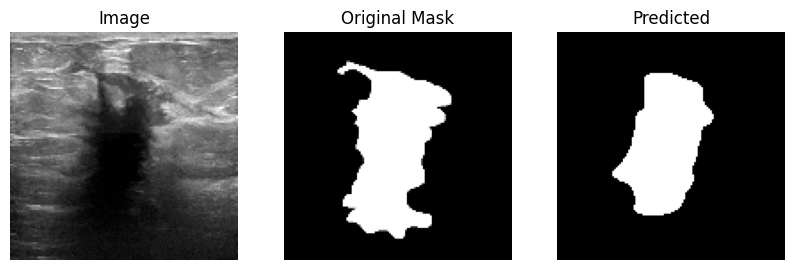

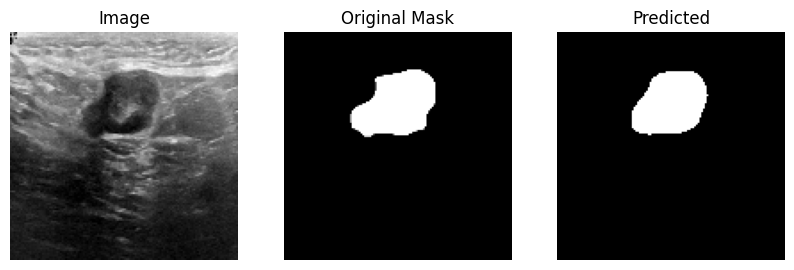

In [ ]:
import torch.nn.functional as F

# Iterate over the test dataset
all_metrics = []
for idx, row in test.iterrows():
    # Load image and mask
    image_path, mask_path = row['image_path'], row['mask_path']
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (128, 128))
    mask = cv2.resize(mask, (128, 128))
    image = torch.tensor(image / 255.0, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
    mask = torch.tensor(mask / 255.0, dtype=torch.float32)
    pred = unet(image)
    pred = pred.squeeze()

    pred_resized = F.interpolate(pred.unsqueeze(0).unsqueeze(0), size=mask.shape, mode='bilinear', align_corners=False)
    pred_resized = pred_resized.squeeze()
    pred_binary = threshold_prediction(pred_resized.cpu().detach().numpy(), threshold=0.5)
    plot_subplots(image.squeeze(), mask, torch.tensor(pred_binary))
    pixel_accuracy, iou, dice = calculate_metrics(mask.numpy(), pred_binary)
    all_metrics.append((pixel_accuracy, iou, dice))


In [ ]:
all_metrics = np.array(all_metrics)
mean_pixel_accuracy = np.mean(all_metrics[:, 0])
mean_iou = np.mean(all_metrics[:, 1])
mean_dice = np.mean(all_metrics[:, 2])

print(f"Mean Pixel Accuracy: {mean_pixel_accuracy:.4f}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean Dice Coefficient: {mean_dice:.4f}")

Mean Pixel Accuracy: 0.9642
Mean IoU: 0.4916
Mean Dice Coefficient: 0.5612
